# Init

In [82]:
import os
import cv2
import math
import time
import numpy as np
import matplotlib.pyplot as plt

In [83]:
class Image:
    def __init__(self):
        self.img=""
    def read_local_img(self,path,val=0):
        self.img = cv2.imread(path)
        if(val==0):
            self.img = cv2.cvtColor(self.img, cv2.COLOR_BGR2RGB)
    def bgr_to_rgb(self):
        self.img = cv2.cvtColor(self.img, cv2.COLOR_BGR2RGB)
    def grayscale(self):
        self.img = cv2.imread(self.img, cmap="gray")
    def print_img(self,fig_size=[0,0],axis_bool=False):
        if fig_size != [0,0]:
            plt.figure(figsize = [fig_size[0],fig_size[1]])
        plt.imshow(self.img)
        if(axis_bool==False):
            plt.axis('off')
        plt.show()
        
class Subplot:
    def __init__(self):
        self.x=1
        self.y=1
        self.fig=[16,16]
        self.arr=1
        self.tot=1
        self.tit=[]

    def print_img_subplot(self,x,y,fi,tot,arr,tit,axis_bool=False):
        self.x=x
        self.y=y
        self.fig=fi
        self.arr=arr
        self.tot=tot
        self.tit=tit
        fig = plt.figure(figsize=(self.fig[0],self.fig[0]))
        for i in range(0,self.tot):
            ax = fig.add_subplot(self.x,self.y,1+i)
            ax.imshow(arr[i],cmap='gray')
            ax.title.set_text(self.tit[i])
            if(axis_bool==False):
                ax.axis('off')

    def print_img_subplot2(self,x,y,fi,tot,arr,axis_bool=False):
        self.x=x
        self.y=y
        self.fig=fi
        self.arr=arr
        self.tot=tot
        f, axarr = plt.subplots(x,y)
        for i in range(0,tot):
            axarr[i//x,i%y].imshow(arr[i])

def bilateral_filter(img,a,b,c):
    return cv2.bilateralFilter(img,a,b,c)

def cmp(img1,img2):
    for i in range(img1.shape[0]):
        for j in range(img1.shape[1]):
            if(img1[i][j]!=img2[i][j]):
                return False
    return True


# Question 1

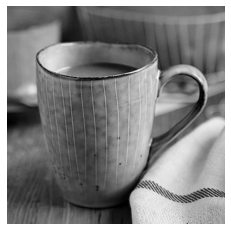

In [84]:
ceramic = Image()
ceramic.read_local_img("../images/ceramic.jpg")
ceramic.img = cv2.cvtColor(ceramic.img, cv2.COLOR_BGR2GRAY)
plt.imshow(ceramic.img, cmap="gray")
plt.axis('off')
plt.show()

## part 1

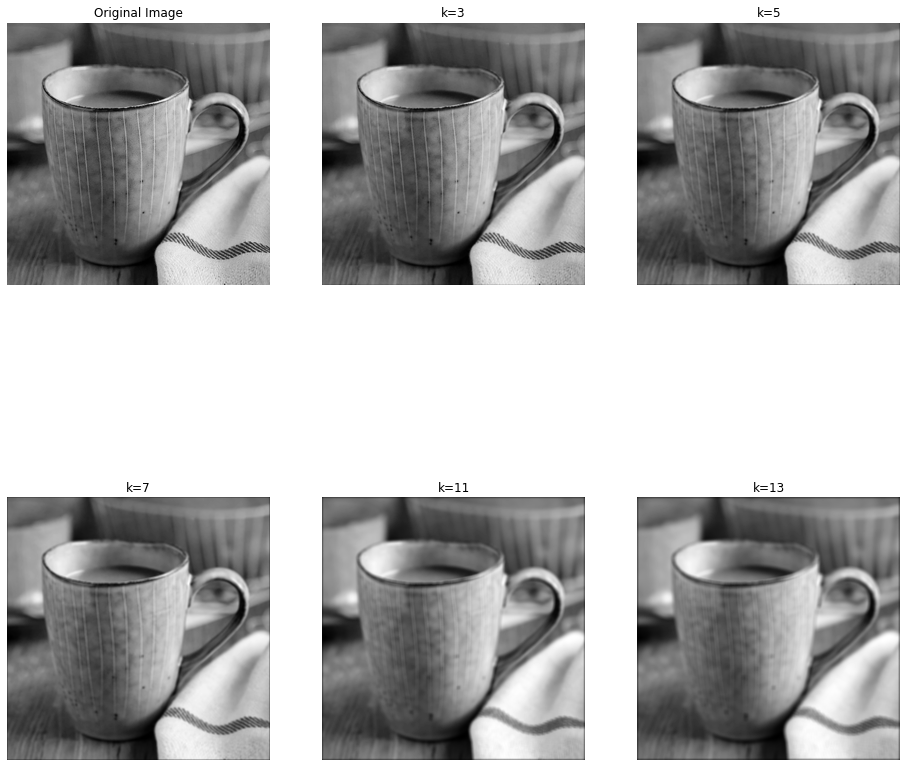

In [85]:
def mean_filter(img,k):
    ss=time.time()
    kk=k*k
    k=k//2
    arr=np.zeros((img.shape[0],img.shape[1])).astype(np.uint8)
    for i in range(0,img.shape[0]):
        for j in range(0,img.shape[1]):
            val=0
            for m in range(-1*k,k+1):
                for n in range(-1*k,k+1):
                    if(i+m>=0 and i+m<img.shape[0] and j+n>=0 and j+n<img.shape[1]):
                        val+=img[i+m][j+n]
                    else:
                        val+=0
            arr[i][j]=val/(kk)
    return arr,time.time()-ss


img1,v1=mean_filter(ceramic.img,3)
img2,v2=mean_filter(ceramic.img,5)
img3,v3=mean_filter(ceramic.img,7)
img4,v4=mean_filter(ceramic.img,11)
img5,v5=mean_filter(ceramic.img,13)

sub = Subplot()
sub.print_img_subplot(2,3,[16,16],6,[ceramic.img,img1,img2,img3,img4,img5],["Original Image","k=3","k=5","k=7","k=11","k=13"])
default_arr=[v1,v2,v3,v4,v5]


## part 2

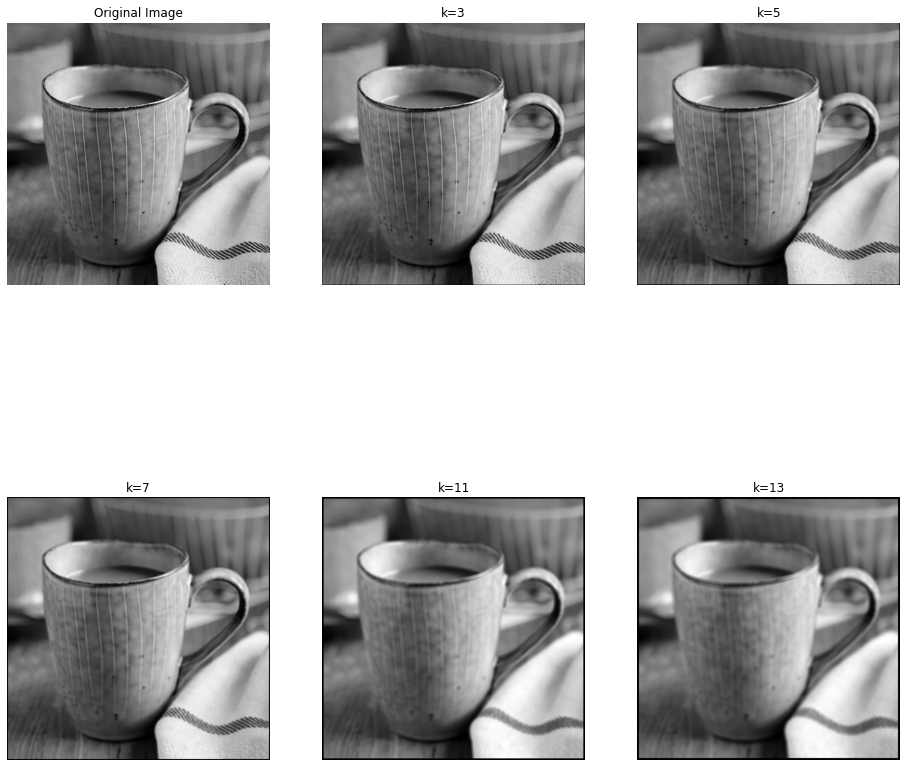

In [86]:
def opt_mean_filter(img,k):
    ss=time.time()
    kk=k*k
    k=k//2
    arr=np.zeros((img.shape[0]+1,img.shape[1]+1))
    for i in range(1,img.shape[0]+1):
        for j in range(1,img.shape[1]+1):
            arr[i][j]=img[i-1][j-1]+arr[i-1][j]+arr[i][j-1]-arr[i-1][j-1]
    arr2 = np.zeros((img.shape[0],img.shape[1])).astype(np.uint8)
    for i in range(0,img.shape[0]):
        for j in range(0,img.shape[1]):
            if(i-k>=0 and j-k>=0 and i+k<img.shape[0] and j+k<img.shape[1]):
                arr2[i][j]=(arr[i+k][j+k]-arr[i+k][j-k]-arr[i-k][j+k]+arr[i-k][j-k])/(kk)
            else:
                arr2[i][j]=0
    return arr2,time.time()-ss

img1,v1=opt_mean_filter(ceramic.img,3)
img2,v2=opt_mean_filter(ceramic.img,5)
img3,v3=opt_mean_filter(ceramic.img,7)
img4,v4=opt_mean_filter(ceramic.img,11)
img5,v5=opt_mean_filter(ceramic.img,13)

sub = Subplot()
sub.print_img_subplot(2,3,[16,16],6,[ceramic.img,img1,img2,img3,img4,img5],["Original Image","k=3","k=5","k=7","k=11","k=13"])
opt_arr=[v1,v2,v3,v4,v5]


### as kernal size increases blurness of image increases

## part 3

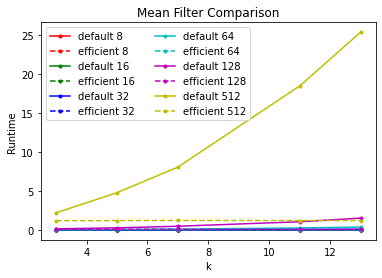

In [87]:
arr=[8,16,32,64,128,512]
arr2=["default 8","efficient 8","default 16","efficient 16","default 32","efficient 32","default 64","efficient 64","default 128","efficient 128","default 512","efficient 512"]
col=["r","g","b","c","m","y"]
for i in range(0,len(arr)):
    img=cv2.resize(ceramic.img,(arr[i],arr[i]))
    img1,v1=mean_filter(img,3)
    img2,v2=mean_filter(img,5)
    img3,v3=mean_filter(img,7)
    img4,v4=mean_filter(img,11)
    img5,v5=mean_filter(img,13)
    default_arr=[v1,v2,v3,v4,v5]
    img1,v1=opt_mean_filter(img,3)
    img2,v2=opt_mean_filter(img,5)
    img3,v3=opt_mean_filter(img,7)
    img4,v4=opt_mean_filter(img,11)
    img5,v5=opt_mean_filter(img,13)
    opt_arr=[v1,v2,v3,v4,v5]
    sarr=[3,5,7,11,13]
    plt.plot(sarr,default_arr,marker=".",color=col[i],label="Default")
    plt.plot(sarr,opt_arr,marker=".",linestyle="--",color=col[i],label="Optimized")
    plt.title("Mean Filter Comparison")
    plt.xlabel("k")
    plt.legend(arr2,ncol=2)
    plt.ylabel("Runtime")
plt.show()


### Time complexity decrease form NxMxKxK to NxM whree n and m are length and width of image

## part 4

In [88]:
def median_filter(img,k):
    aa=time.time()
    arr=np.zeros((img.shape[0],img.shape[1])).astype(np.uint8)
    kk=k*k
    k=k//2
    for i in range(0,img.shape[0]):
        for j in range(0,img.shape[1]):
            arr2=[]
            for m in range(-1*k,k+1):
                for n in range(-1*k,k+1):
                    if(i+m>=0 and i+m<img.shape[0] and j+n>=0 and j+n<img.shape[1]):
                        arr2.append(img[i+m][j+n])
            if(len(arr2)==kk):
                arr[i][j]=np.median(arr2)
            else:
                arr[i][j]=255
    return arr,time.time()-aa

def median_filter2(img,k):
    aa=time.time()
    n,m = len(img),len(img[0])
    res = np.zeros((n-k+1,m-k+1))
    res1 = np.zeros((n,m))
    for i in range(n-k+1):
        for j in range(m-k+1):
            res[i,j] = np.median(img[i:i+k,j:j+k].flatten())
            res1[i+k//2,j+k//2] = np.median(img[i:i+k,j:j+k].flatten())
    return res1,time.time()-aa

def median_filter3(img,k):
    aa=time.time()
    arr=np.zeros((img.shape[0],img.shape[1]))
    arr1=np.zeros((img.shape[0],img.shape[1]))
    arr.fill(255)
    arr1.fill(255)
    for i in range(0,img.shape[0]-k+1):
        for j in range(0,img.shape[1]-k+1):
            if j==0 :
                arr=img[i:i+k,j:j+k].flatten().tolist()
            else:
                for c in range(0,k):
                    arr.remove(img[i+c][j-1])
                    arr.append(img[i+c][j+k-1])
            arr.sort()
            arr1[i+k//2][j+k//2]=arr[len(arr)//2]
    return arr1,time.time()-aa


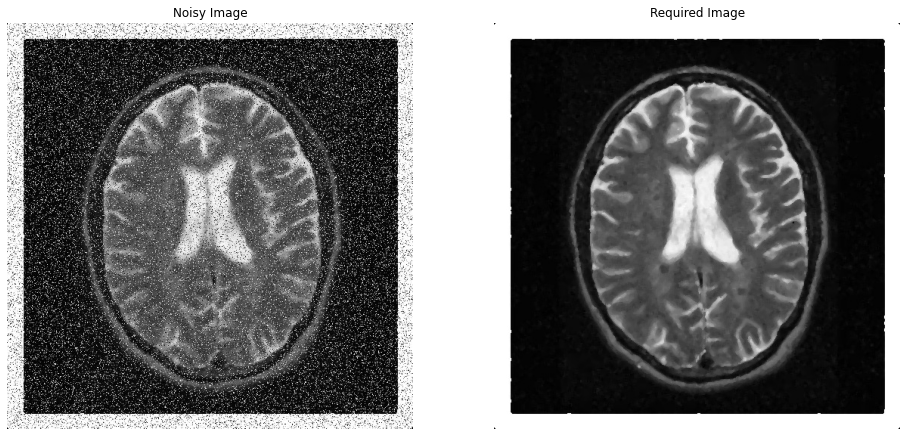

In [89]:
sub = Subplot()

brainNoisy=Image()
brainNoisy.read_local_img("../images/brainNoisy.jpg")
brainNoisy.img=cv2.cvtColor(brainNoisy.img,cv2.COLOR_BGR2GRAY)

brain=Image()
brain.read_local_img("../images/brain.jpg")
brain.img=cv2.cvtColor(brain.img,cv2.COLOR_BGR2GRAY)
sub.print_img_subplot(1,2,[16,16],2,[brainNoisy.img,brain.img],["Noisy Image","Required Image"])


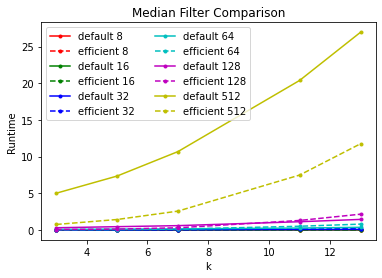

In [90]:
arr=[8,16,32,64,128,512]
arr2=["default 8","efficient 8","default 16","efficient 16","default 32","efficient 32","default 64","efficient 64","default 128","efficient 128","default 512","efficient 512"]
col=["r","g","b","c","m","y"]
for i in range(0,len(arr)):
    img=cv2.resize(brainNoisy.img,(arr[i],arr[i]))
    img1,v1=median_filter(img,3)
    img2,v2=median_filter(img,5)
    img3,v3=median_filter(img,7)
    img4,v4=median_filter(img,11)
    img5,v5=median_filter(img,13)
    default_arr=[v1,v2,v3,v4,v5]
    # img1,v1=median_filter2(img,3)
    # img2,v2=median_filter2(img,5)
    # img3,v3=median_filter2(img,7)
    # img4,v4=median_filter2(img,11)
    # img5,v5=median_filter2(img,13)
    # opt_arr1=[v1,v2,v3,v4,v5]
    img1,v1=median_filter3(img,3)
    img2,v2=median_filter3(img,5)
    img3,v3=median_filter3(img,7)
    img4,v4=median_filter3(img,11)
    img5,v5=median_filter3(img,13)
    opt_arr2=[v1,v2,v3,v4,v5]
    sarr=[3,5,7,11,13]
    plt.plot(sarr,default_arr,marker=".",color=col[i],label="Default")
    # plt.plot(sarr,opt_arr1,marker=".",linestyle="-.",color=col[i],label="Optimized1")
    plt.plot(sarr,opt_arr2,marker=".",linestyle="--",color=col[i],label="Optimized")
    plt.title("Median Filter Comparison")
    plt.xlabel("k")
    plt.legend(arr2,ncol=2)
    plt.ylabel("Runtime")
plt.show()

### Time complexity decrease form NxMxKxKxlog(K*K) to NxMxKxlog(K*K) whree n and m are length and width of image

## part 5

### `median filter` is best suited for noise reduction due to presence of random noise both salt as well as pepper.



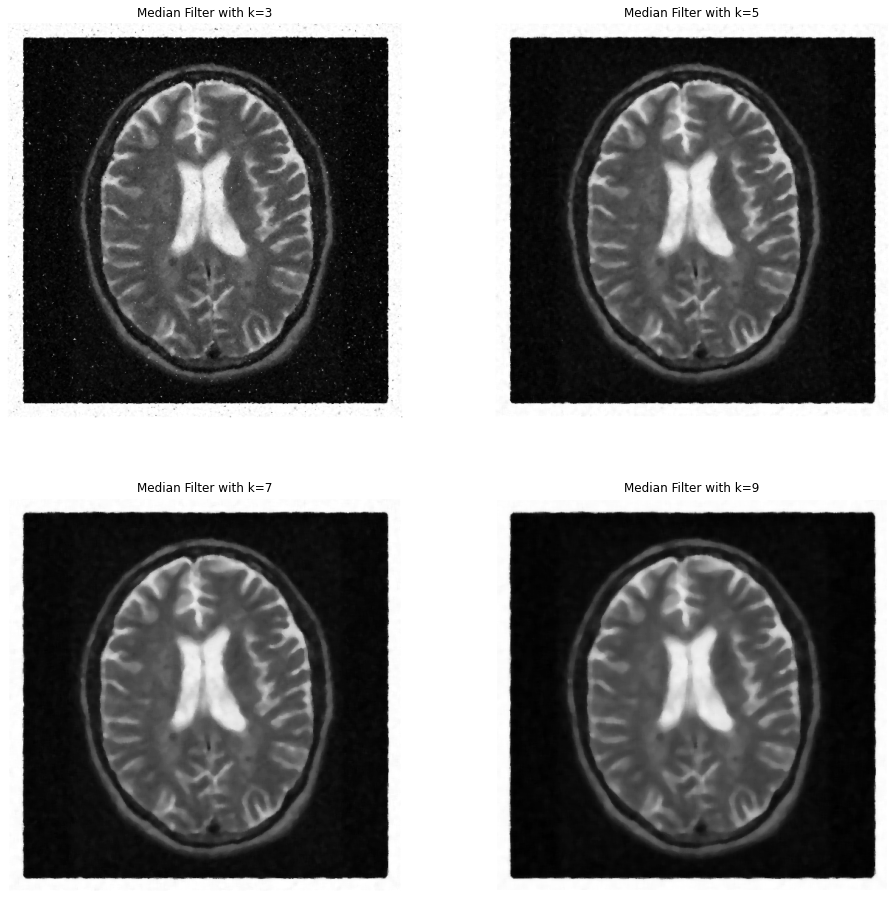

In [91]:
aa=[]
bb=[]
for i in range(1,5):
    img,aaa=median_filter3(brainNoisy.img,i+i+1)
    aa.append(img)
    bb.append("Median Filter with k="+str(i+i+1))

sub2=Subplot()
sub2.print_img_subplot(2,2,[16,16],4,aa,bb)

### can't found an exact match as required image but can found a close match at k=7 since k=3 and k=5 still has some salt noise so as k increase the noise will decrease but the image tends to be blurred to a degree proportional to the size of the median filter.

In [92]:
for i in range(0,7):
    img,aaa=median_filter3(brainNoisy.img,i+i+3)
    if(cmp(img,brain.img)):
        print("Equal",i+i+3)
        break
    else:
        print("Not Equal",i+i+3)

Not Equal 3
Not Equal 5
Not Equal 7
Not Equal 9
Not Equal 11
Not Equal 13
Not Equal 15


# Question 2


## part 1

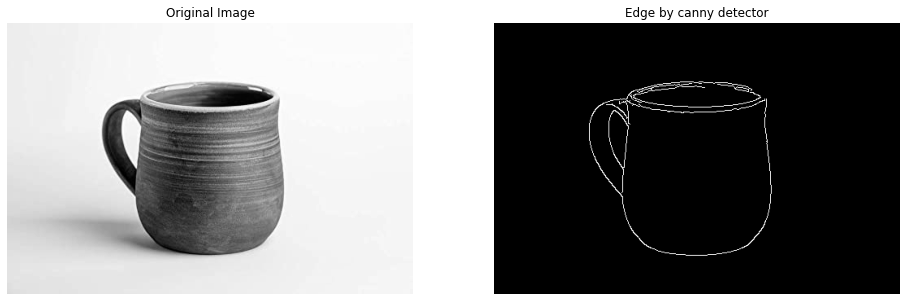

In [93]:
cup=Image()
cup.read_local_img("../images/cup.jpg")
cup.img=cv2.cvtColor(cup.img,cv2.COLOR_BGR2GRAY)
aa=[]
bb=[]
aa.append(cup.img)
bb.append("Original Image")
aa.append(cv2.Canny(cup.img,900,100))
bb.append("Edge by canny detector")
sub = Subplot()
sub.print_img_subplot(2,2,[16,16],2,aa,bb)



## part 2

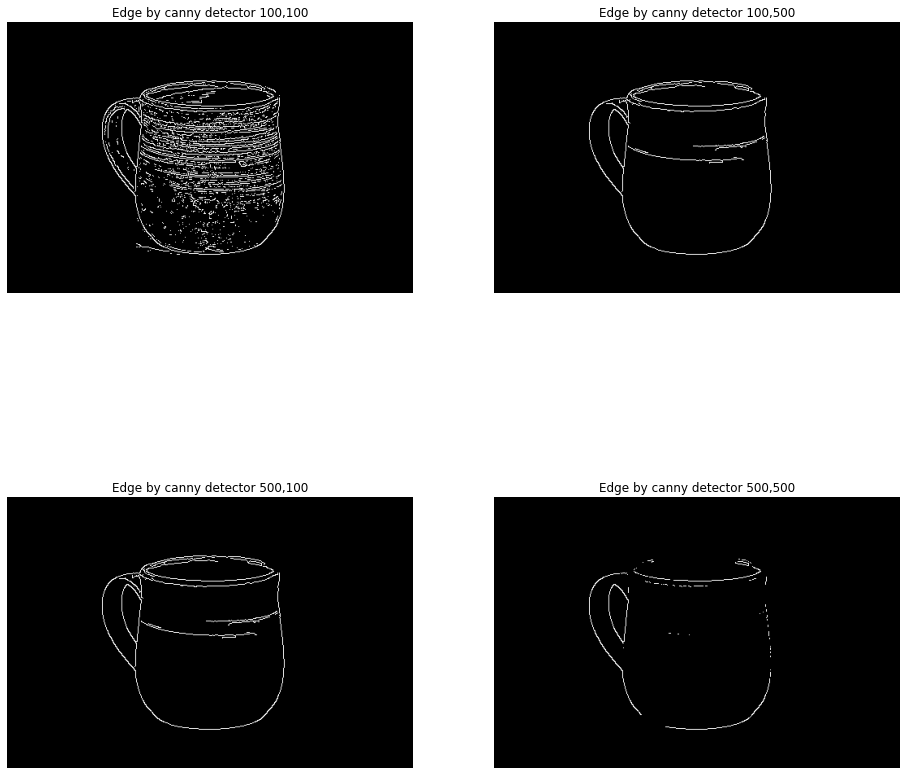

In [94]:
aa=[]
bb=[]

aa.append(cv2.Canny(cup.img,100,100))
bb.append("Edge by canny detector 100,100")

aa.append(cv2.Canny(cup.img,100,500))
bb.append("Edge by canny detector 100,500")

aa.append(cv2.Canny(cup.img,500,100))
bb.append("Edge by canny detector 500,100")

aa.append(cv2.Canny(cup.img,500,500))
bb.append("Edge by canny detector 500,500")

sub = Subplot()
sub.print_img_subplot(2,2,[16,16],4,aa,bb)

### Canny edge detection algorithm is used to detect a wide range of edges in images and it edge gradient is present in range of maxVal and minVal and as there value changes the out put varies as well it will depend only on the image's edges gradient values.

## part 3

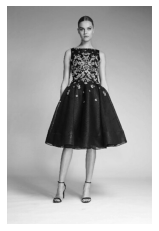

In [95]:
girl=Image()
girl.read_local_img("../images/girl.jpg")
girl.img=cv2.cvtColor(girl.img,cv2.COLOR_BGR2GRAY)
plt.imshow(girl.img,cmap='gray')
plt.axis('off')
plt.show()

In [96]:
def magic2(ker,img):
    kk=len(ker)
    if kk%2==0:
        ker1=np.zeros((kk+1,kk+1))
        for i in range(1,kk+1):
            for j in range(1,kk+1):
                ker1[i][j]=ker[i-1][j-1]
        ker=ker1
    kk=kk//2
    arr=np.zeros((img.shape[0],img.shape[1]))
    for i in range(kk,img.shape[0]-2):
        for j in range(2,img.shape[1]-kk):
            val=0
            for aa in range(-kk,kk+1):
                for bb in range(-kk,kk+1):
                    val+=img[i+aa][j+bb]*ker[kk+aa][kk+bb]
            arr[i][j]=val
    return arr

def cc(img):
    mini=np.min(img)
    maxi=np.max(img)
    arr=np.zeros((img.shape[0],img.shape[1]))
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            arr[i][j]=(img[i][j]-mini)*255.0/(maxi-mini)
    return arr

In [97]:
def magic(ker,img):
    arr=np.zeros
    k=len(ker)
    arr=np.zeros((img.shape[0],img.shape[1]))
    for i in range(1,img.shape[0]):
        for j in range(1,img.shape[1]):
            val=0
            for m in range(0,k):
                for n in range(0,k):
                    if(i+m-1>=0 and i+m-1<img.shape[0] and j+n-1>=0 and j+n-1<img.shape[1]):
                        val+=(img[i+m-1][j+n-1]*ker[m][n])
                    else:
                        val+=0
            if(val>255):
                val=255
            elif(val<0):
                val=0
            arr[i][j]=val
    return arr
    # return arr.astype(np.uint8)

perwittx = [[-1,0,1],[-1,0,1],[-1,0,1]]
perwitty = [[1,1,1],[0,0,0],[-1,-1,-1]]

sobelx = [[-1,0,1],[-2,0,2],[-1,0,1]]
sobely = [[1,2,1],[0,0,0],[-1,-2,-1]]

robertx = [[0,1],[-1,0]]
roberty = [[1,0],[0,-1]]

lap1 = [[0,1,0],[1,-4,1],[0,1,0]]
lap2 = [[1,1,1],[1,-8,1],[1,1,1]]


Canny


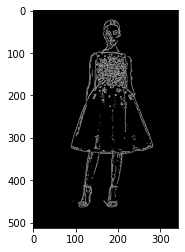

In [98]:
print("Canny")
imgg=cv2.Canny(girl.img,100,100)
plt.imshow(imgg,cmap="gray")
plt.show()


In [99]:
def cclip(img):
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if(img[i][j]<0):
                img[i][j]=0
            if(img[i][j]>255):
                img[i][j]=255
    return img

Prewitt


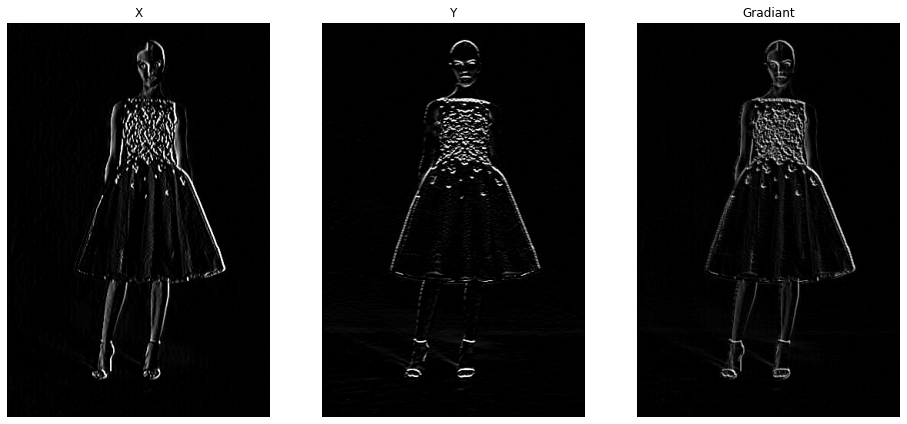

In [100]:
print("Prewitt")
img1=cclip(magic2(perwittx,girl.img))
img2=cclip(magic2(perwitty,girl.img))
img3=cclip(((img1)+(img2))/2)
Perwitt=Subplot()
Perwitt.print_img_subplot(1,3,[16,16],3,[img1,img2,img3],["X","Y","Gradiant"])


Sobel


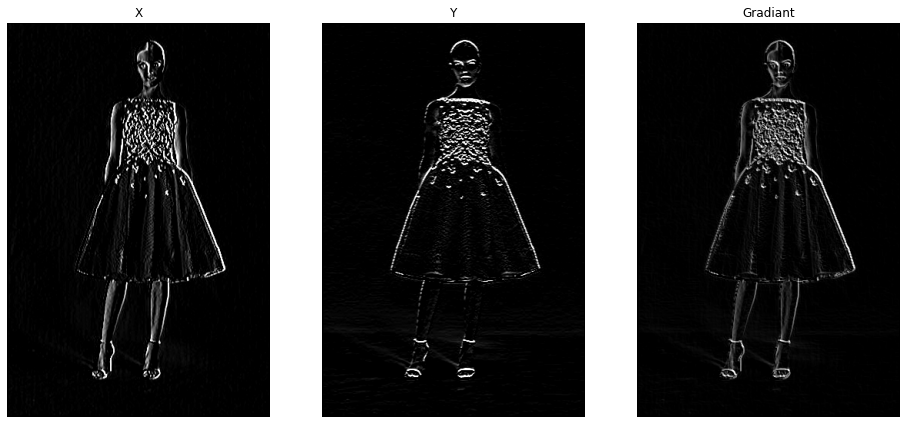

In [101]:

print("Sobel")
img1=cclip(magic2(sobelx,girl.img))
img2=cclip(magic2(sobely,girl.img))
img3=cclip(((img1)+(img2))/2)
Sobel=Subplot()
Sobel.print_img_subplot(1,3,[16,16],3,[img1,img2,img3],["X","Y","Gradiant"])


Robert


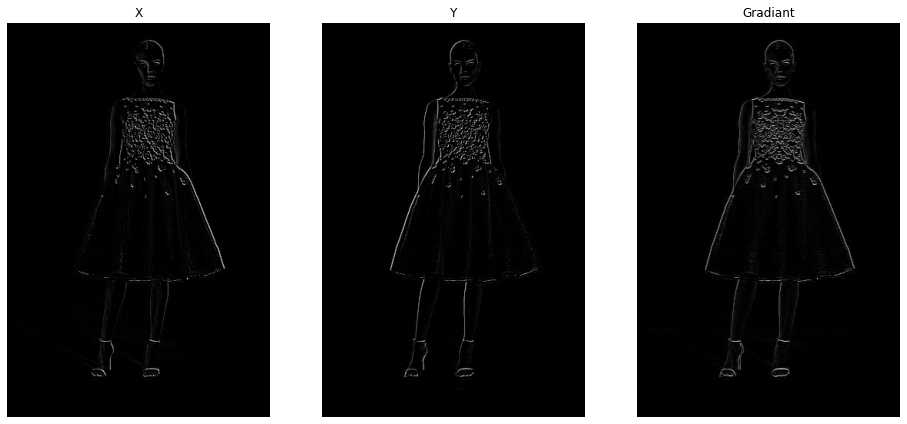

In [102]:

print("Robert")
img1=cclip(magic2(robertx,girl.img))
img2=cclip(magic2(roberty,girl.img))
img3=cclip(((img1)+(img2))/2)
Robert=Subplot()
Robert.print_img_subplot(1,3,[16,16],3,[img1,img2,img3],["X","Y","Gradiant"])


Laplacian


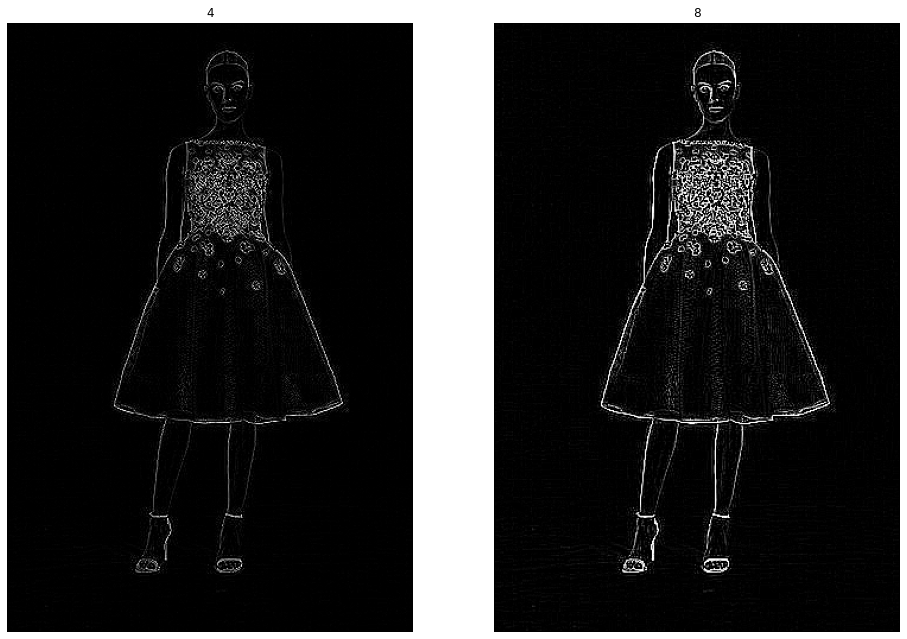

In [103]:
print("Laplacian")
Lap=Subplot()
Lap.print_img_subplot(1,2,[16,16],2,[magic(lap1,girl.img),magic(lap2,girl.img)],["4","8"])


## part 4


Prewitt


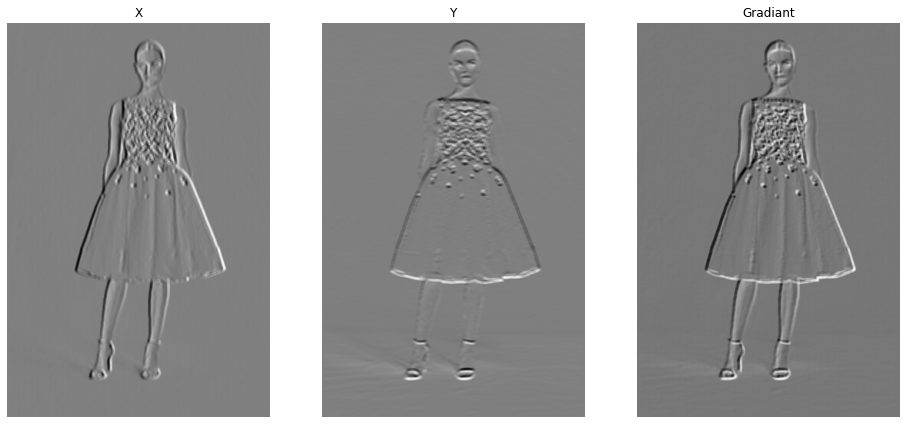

In [104]:
perwittx5 = [[-2,-1,0,1,2],[-2,-1,0,1,2],[-2,-1,0,1,2],[-2,-1,0,1,2],[-2,-1,0,1,2]]
perwitty5 = [[-2,-2,-2,-2,-2],[-1,-1,-1,-1,-1],[0,0,0,0,0],[1,1,1,1,1],[2,2,2,2,2]]

sobelx5 = [[-2,-1,0,1,2],[-2,-1,0,1,2],[-4,-2,0,2,4],[-2,-1,0,1,2],[-2,-1,0,1,2]]
sobely5 = [[2,2,4,2,2],[1,1,2,1,1],[0,0,0,0,0],[-1,-1,-2,-1,-1],[-2,-2,-4,-2,-2]]

print("Prewitt")
img1=magic2(perwittx5,girl.img)
img2=magic2(perwitty5,girl.img)
img3=(((cc(img1))**2+(cc(img2))**2)**0.5)
Perwitt=Subplot()
Perwitt.print_img_subplot(1,3,[16,16],3,[img1,img2,cc(img3)],["X","Y","Gradiant"])



Sobel


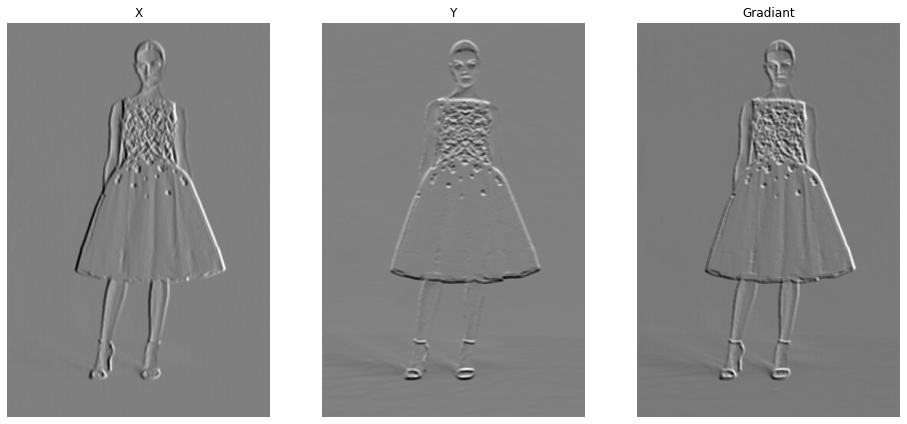

In [105]:

print("Sobel")
img1=(magic2(sobelx5,girl.img))
img2=(magic2(sobely5,girl.img))
img3=(((cc(img1))**2+(cc(img2))**2)**0.5)
Sobel=Subplot()
Sobel.print_img_subplot(1,3,[16,16],3,[img1,img2,img3],["X","Y","Gradiant"])

### As the Kernel size increases, more pixels are now a part of the convolution process. This signifies that the gradient map (edges) will tend to get blurry to a point the output image will be blurred and will include some minutes edges too which were ignored in small kernal img.

## part5

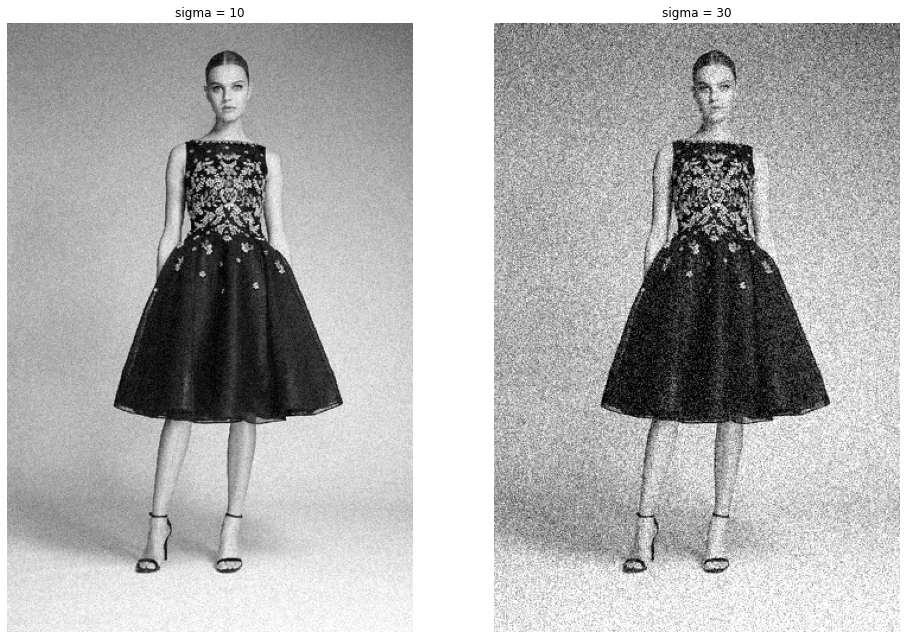

In [106]:
sigma1=10
girlNoisy1=Image()
girlNoisy1.read_local_img("../images/girlNoisy1.jpg")
girlNoisy1.img=cv2.cvtColor(girlNoisy1.img,cv2.COLOR_BGR2GRAY)


sigma2=30
girlNoisy2=Image()
girlNoisy2.read_local_img("../images/girlNoisy2.jpg")
girlNoisy2.img=cv2.cvtColor(girlNoisy2.img,cv2.COLOR_BGR2GRAY)


Gauss=Subplot()
Gauss.print_img_subplot(1,2,[16,16],2,[girlNoisy1.img,girlNoisy2.img],["sigma = 10","sigma = 30"])


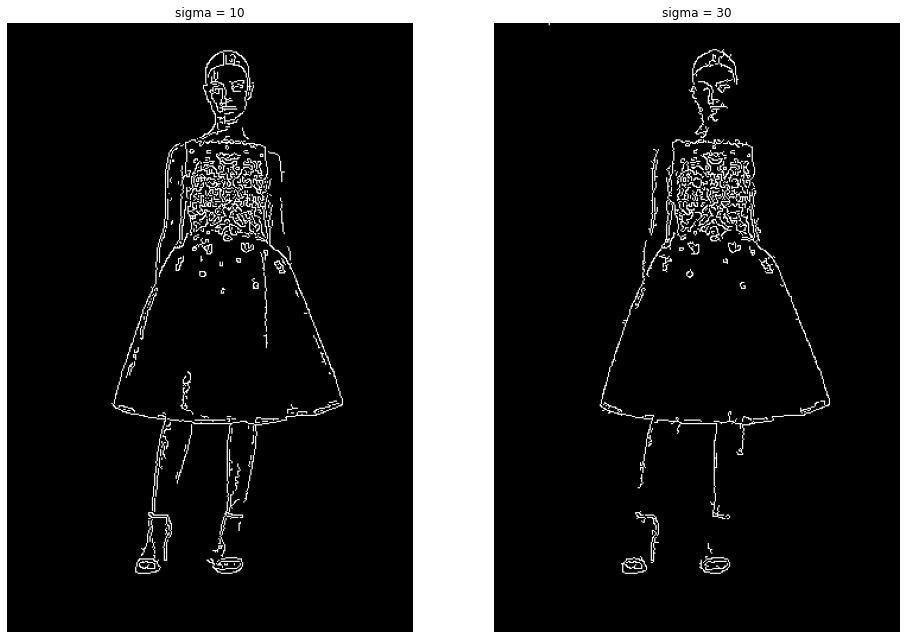

In [107]:
img1=cv2.Canny(girlNoisy1.img,100,175,L2gradient = True)
img2=cv2.Canny(girlNoisy2.img,490,200,L2gradient = True)
Gauss=Subplot()
Gauss.print_img_subplot(1,2,[16,16],2,[img1,img2],["sigma = 10","sigma = 30"])


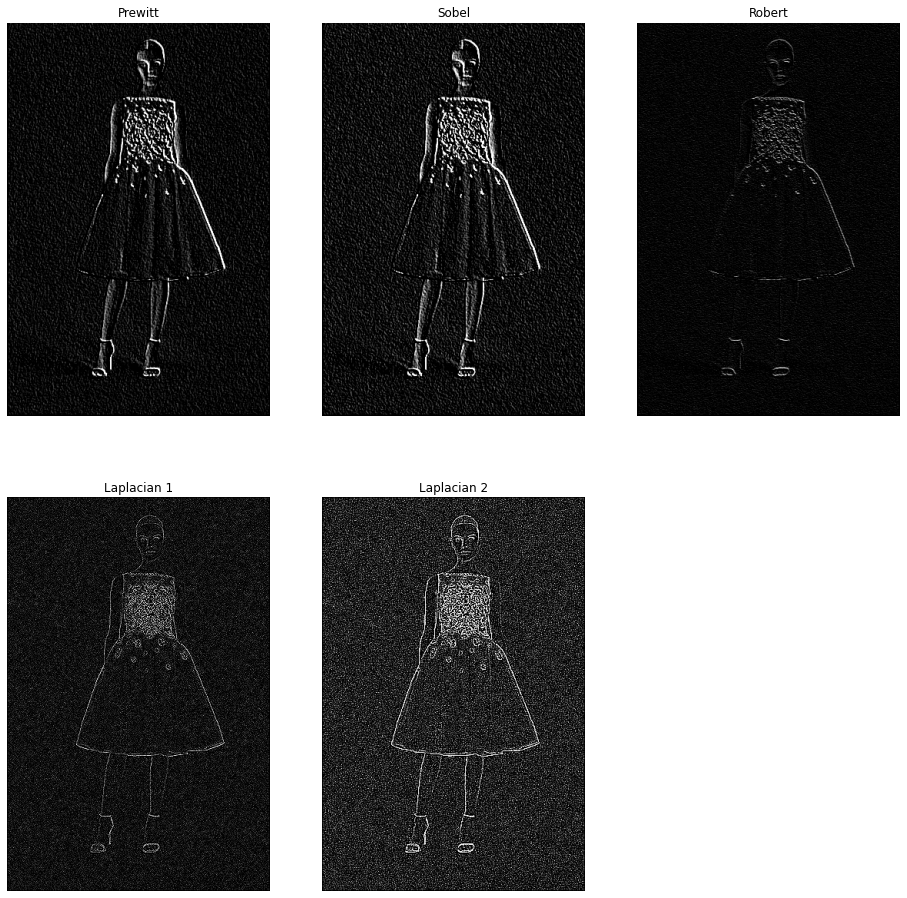

In [108]:
per=cclip((magic2(perwittx,girlNoisy1.img))+(magic2(perwitty,girlNoisy1.img))/2)
sob=cclip((magic2(sobelx,girlNoisy1.img))+(magic2(sobely,girlNoisy1.img))/2)
rob=cclip((magic2(robertx,girlNoisy1.img))+(magic2(roberty,girlNoisy1.img))/2)
lapp1=magic(lap1,girlNoisy1.img)
lapp2=magic(lap2,girlNoisy1.img)
n1=Subplot()
n1.print_img_subplot(2,3,[16,16],5,[per,sob,rob,lapp1,lapp2],["Prewitt","Sobel","Robert","Laplacian 1","Laplacian 2"])

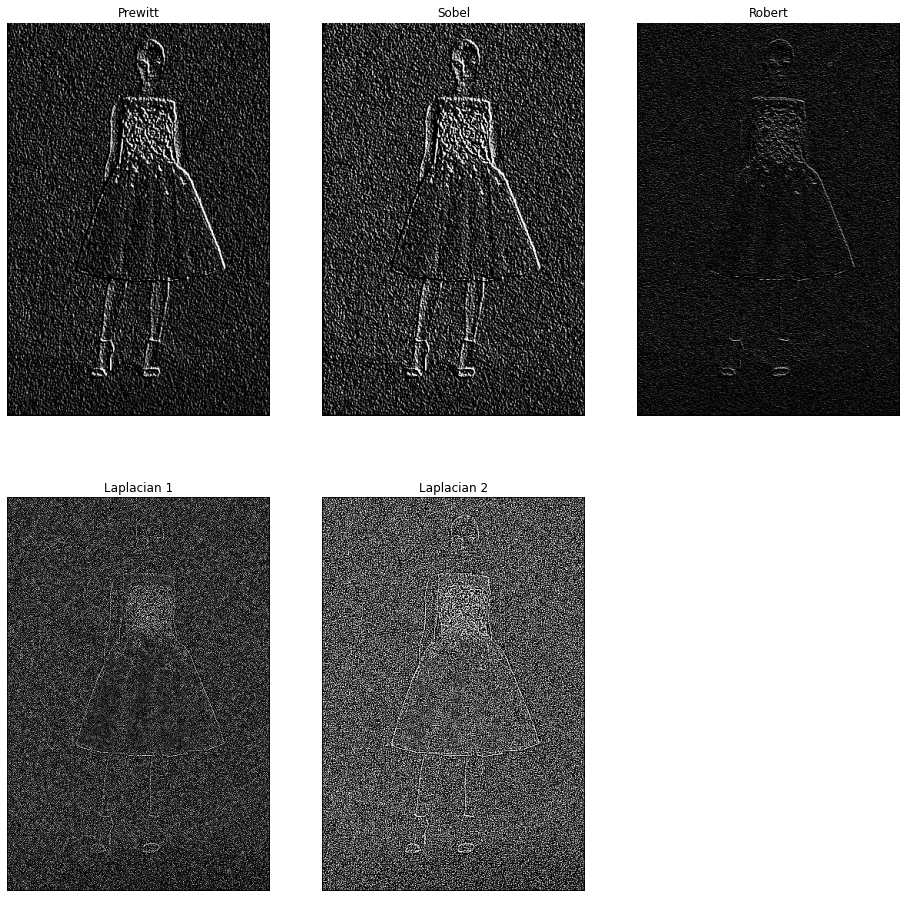

In [109]:
per=cclip((magic2(perwittx,girlNoisy2.img))+(magic2(perwitty,girlNoisy2.img))/2)
sob=cclip((magic2(sobelx,girlNoisy2.img))+(magic2(sobely,girlNoisy2.img))/2)
rob=cclip((magic2(robertx,girlNoisy2.img))+(magic2(roberty,girlNoisy2.img))/2)
lapp1=magic(lap1,girlNoisy2.img)
lapp2=magic(lap2,girlNoisy2.img)
n1=Subplot()
n1.print_img_subplot(2,3,[16,16],5,[per,sob,rob,lapp1,lapp2],["Prewitt","Sobel","Robert","Laplacian 1","Laplacian 2"])

### as noise increase it is more difficut to find the edges in the image using canny edge detection algorithm and there are best results i can achieved to show the edges for girl and her dress

### Observation by comparing different filters from each other
+ #### best outcome is from robert filter then perwitt then sobel
+ #### as center value increses in kernel quality of outcome decreses

### Observation by comparing sigma value of noise
+ #### as sigma value of noise increses quality of outcome decreses

# Question 3

## part 1

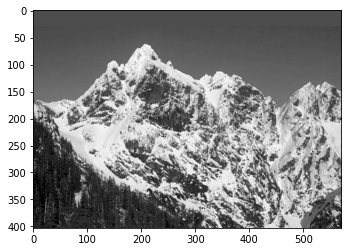

In [110]:
mountain=Image()
mountain.read_local_img("../images/mountain.png")
mountain.img=cv2.cvtColor(mountain.img,cv2.COLOR_BGR2GRAY)
plt.imshow(mountain.img,cmap='gray')
plt.show()

In [111]:
def gaussian_filter(img,k,sigma):
    arr=np.zeros((img.shape[0],img.shape[1]))
    kk=k//2
    ss=sigma
    aaar=np.zeros((k,k))
    for x in range(0,k):
        for y in range(0,k):
            aaar[x][y]= math.exp(-((x*x+y*y)/(2*ss*ss)))

    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            val=0.0
            for x in range(-1*kk,kk+1):
                for y in range(-1*kk,kk+1):
                    if(i+x>=0 and i+x<img.shape[0] and j+y>=0 and j+y<img.shape[1]):
                        val+=img[i+x][j+y]*aaar[x][y]
            arr[i][j]=val
    return arr

### Best sigma sigma=(n-1)/6 to covers 99%

In [112]:
def best_sigma(ker):
    return ((ker-1)/6)

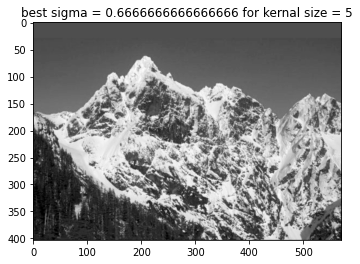

In [113]:

imgs=gaussian_filter(mountain.img,5,best_sigma(5))
plt.imshow(imgs,cmap='gray')
plt.title("best sigma = "+str(best_sigma(5))+" for kernal size = "+str(5))
plt.show()


Gaussian filter with random sigmas


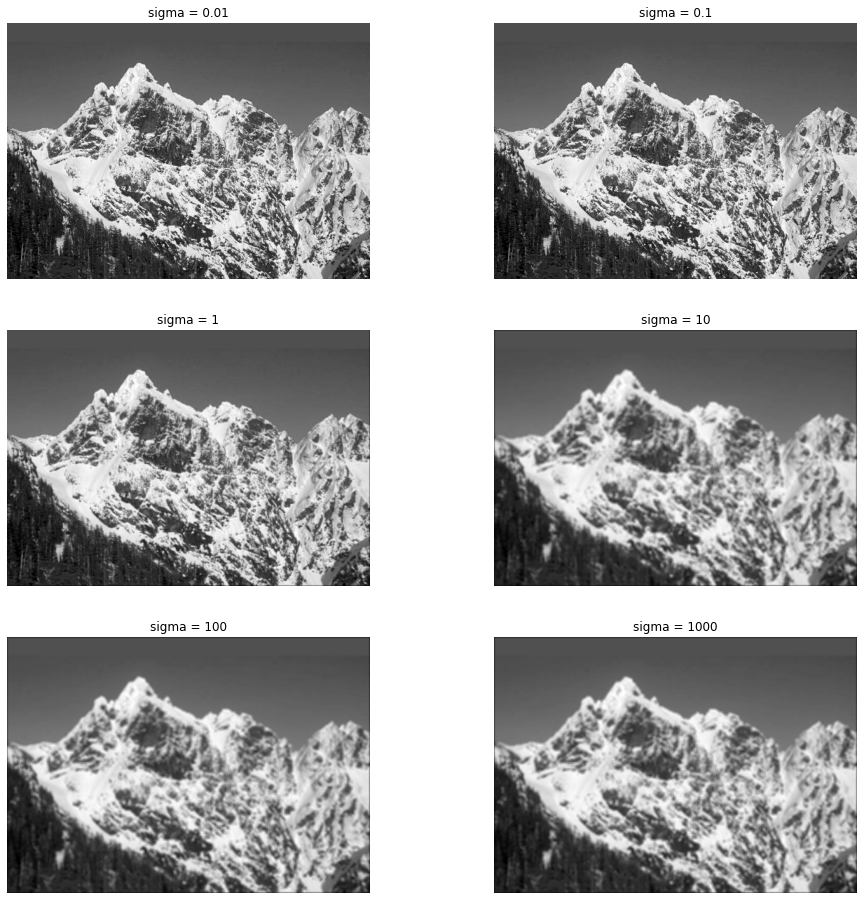

In [114]:
img01=gaussian_filter(mountain.img,5,0.01)
img02=gaussian_filter(mountain.img,5,0.1)
img1=gaussian_filter(mountain.img,5,1)
img2=gaussian_filter(mountain.img,5,10)
img3=gaussian_filter(mountain.img,5,100)
img4=gaussian_filter(mountain.img,5,1000)
Gauss=Subplot()
print("Gaussian filter with random sigmas")
Gauss.print_img_subplot(3,2,[16,16],6,[img01,img02,img1,img2,img3,img4],["sigma = 0.01","sigma = 0.1","sigma = 1","sigma = 10","sigma = 100","sigma = 1000"])


### As sigma increases while keeping kernel matrix fixed to 5x5 results in increase of blurring effect in image

Gaussian filter with best sigmas


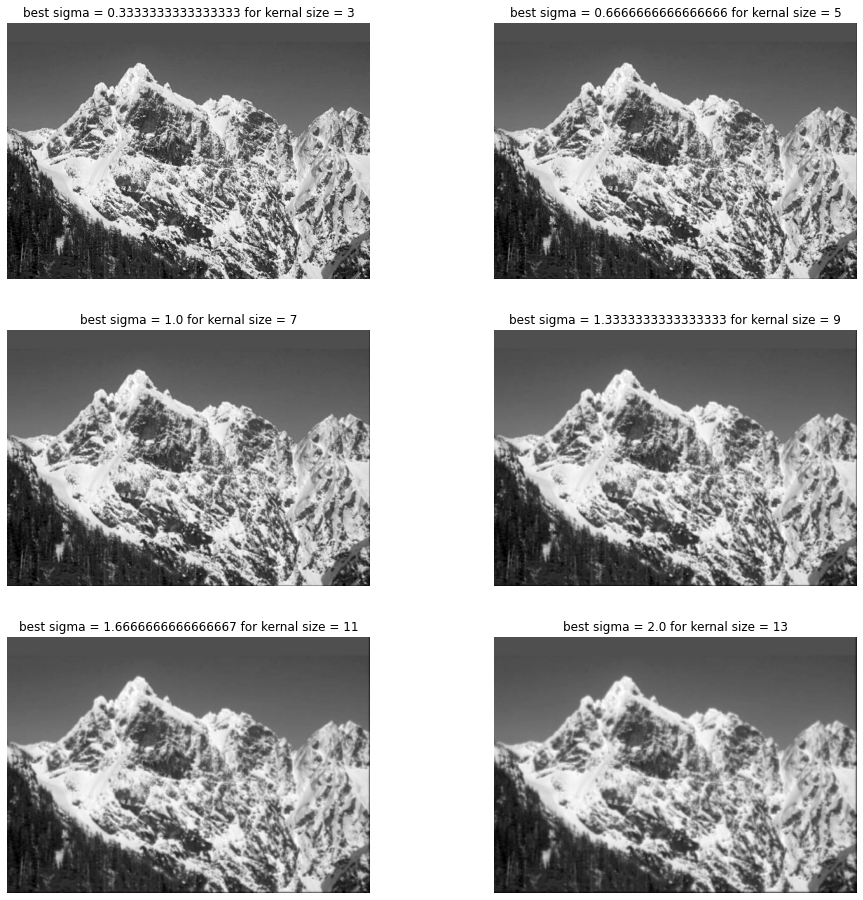

In [115]:
aa=[]
bb=[]
for i in range(6):
    aa.append(gaussian_filter(mountain.img,i+i+3,best_sigma(i+i+3)))
    bb.append("best sigma = "+str(best_sigma(i+i+3))+" for kernal size = "+str(3+i+i))
print("Gaussian filter with best sigmas")
Gauss=Subplot()
Gauss.print_img_subplot(3,2,[16,16],6,aa,bb)

## part 2


In [116]:
def bilateral_filtering(img1,k,sigma1,sigma2):
    kk=k//2
    if sigma1==0:
        sigma1=0.0000000001
    if sigma2==0:
        sigma2=0.0000000001
    aaar=np.zeros((k,k))
    for x in range(0,k):
        for y in range(0,k):
            aaar[x][y]= math.exp(-((x*x+y*y)/(2*sigma1*sigma1)))
            
    arr=np.zeros((img1.shape[0],img1.shape[1]))
    img=np.zeros((img1.shape[0],img1.shape[1]))
    for i in range(img1.shape[0]):
        for j in range(img1.shape[1]):
            img[i][j]=img1[i][j]
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            val=0.0
            bal=0.0
            for x in range(-1*kk,kk+1):
                for y in range(-1*kk,kk+1):
                    if(i+x>=0 and i+x<img.shape[0] and j+y>=0 and j+y<img.shape[1]):
                        wt=aaar[x][y]*math.exp(-((abs(img[i+x][j+y]-img[i][j]))/(2*(sigma2**2))))
                        val+=img[i+x][j+y]*wt
                        bal+=wt
            arr[i][j]=val/bal
    return arr


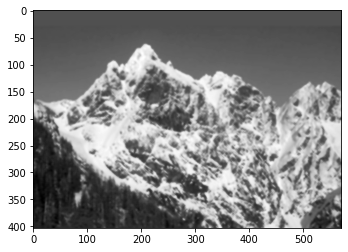

In [117]:
img1=bilateral_filtering(mountain.img,5,10,10)
plt.imshow(img1,cmap='gray')
plt.show()


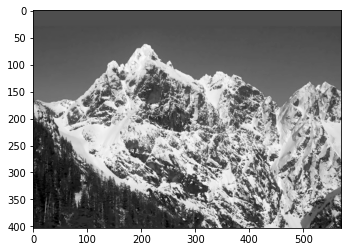

In [118]:
img1=bilateral_filtering(mountain.img,5,10,2)
img1=img1.astype(np.uint8)
plt.imshow(img1,cmap='gray')
plt.show()

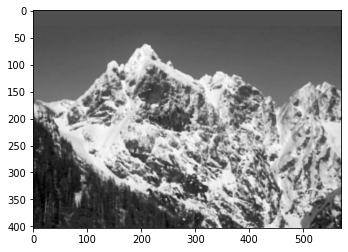

In [119]:
img1=cv2.bilateralFilter(mountain.img,5,100,100)
plt.imshow(img1,cmap='gray')
plt.show()

+ ### As in gaussian filter as kernal increses blurness increases
+ ### As in gaussian sigma increses blurness increases
+ ### As in intesity sigma increses blurness increases but effect on edges are less as compared form gaussian filter

# Question 4

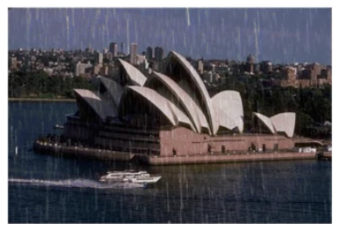

In [120]:
rain=Image()
rain.read_local_img("../images/rain.png")
rain.print_img()

In [121]:
def layered_img(img):
    layere1=np.zeros((img.shape[0],img.shape[1])).astype(np.uint8)
    layere2=np.zeros((img.shape[0],img.shape[1])).astype(np.uint8)
    layere3=np.zeros((img.shape[0],img.shape[1])).astype(np.uint8)
    for i in range(0,img.shape[0]):
        for j in range(0,img.shape[1]):
            layere1[i][j]=img[i][j][0]
            layere2[i][j]=img[i][j][1]
            layere3[i][j]=img[i][j][2]
            
    return layere1,layere2,layere3

def delayer_img(l1,l2,l3):
    arr=np.zeros((l1.shape[0],l1.shape[1],3)).astype(np.uint8)
    for i in range(0,l1.shape[0]):
        for j in range(0,l2.shape[1]):
            arr[i][j][0]=l1[i][j]
            arr[i][j][1]=l2[i][j]
            arr[i][j][2]=l3[i][j]
    return arr.astype(np.uint8)


## part 1
* Using Gaussina Filter
* Result is very blured image advised not to use gaussian filter to remove rain. Moreover increase in sigma in not much favourable as compare to increase kernal size
* As kernal size increase imgae gets more blured so i used 5x5 and alter sigma

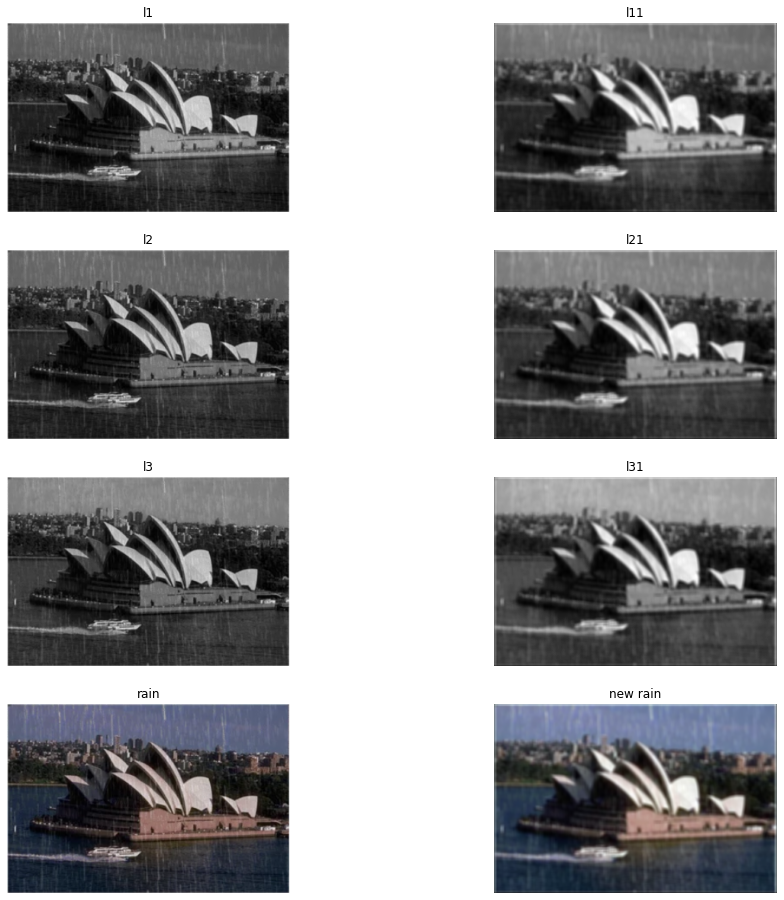

In [122]:
l1,l2,l3=layered_img(rain.img)
l11=gaussian_filter(l1,5,5)
l21=gaussian_filter(l2,5,5)
l31=gaussian_filter(l3,5,5)
l11*= 255.0/l11.max()
l21*= 255.0/l21.max()
l31*= 255.0/l31.max()
img1=delayer_img(l11,l21,l31)
Gauss=Subplot()
Gauss.print_img_subplot(4,2,[16,16],8,[l1,l11,l2,l21,l3,l31,rain.img,img1],["l1","l11","l2","l21","l3","l31","rain","new rain"])


## part 2
* Using Median Filter
* Result is better than gaussina filter but still not perfect.

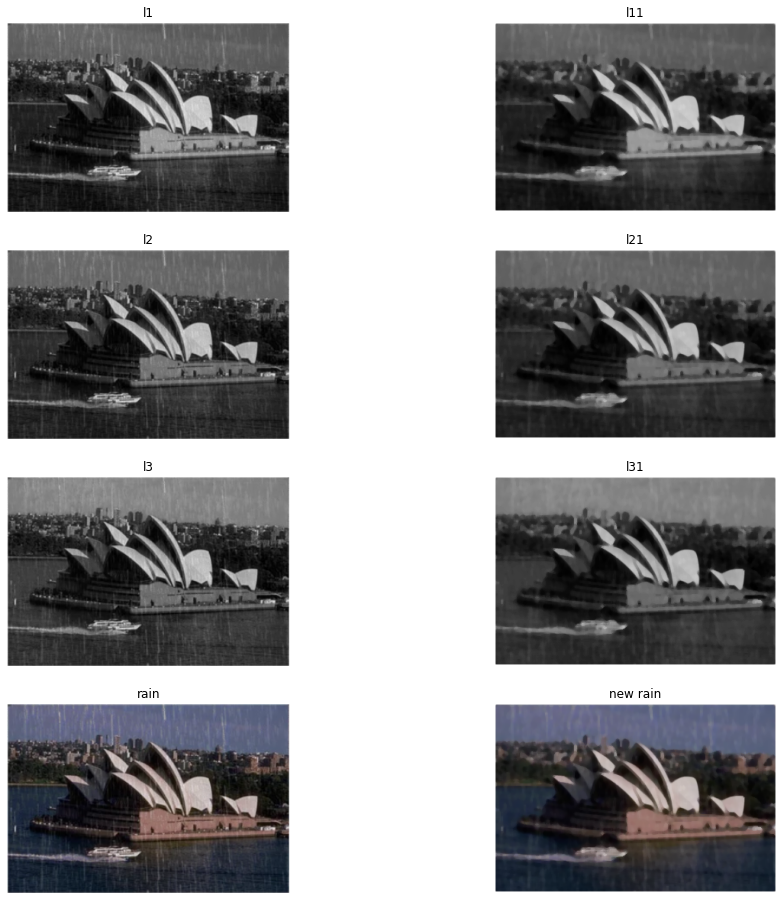

In [123]:
l1,l2,l3=layered_img(rain.img)
l11,aa=median_filter3(l1,5)
l21,aa=median_filter3(l2,5)
l31,aa=median_filter3(l3,5)

l11*= 255.0/l11.max()
l21*= 255.0/l21.max()
l31*= 255.0/l31.max()
img2=delayer_img(l11,l21,l31)

Median=Subplot()
Median.print_img_subplot(4,2,[16,16],8,[l1,l11,l2,l21,l3,l31,rain.img,img2],["l1","l11","l2","l21","l3","l31","rain","new rain"])


## part 3
* Using Bilateral Filter
* Result is better than gaussina filter but still not perfect.

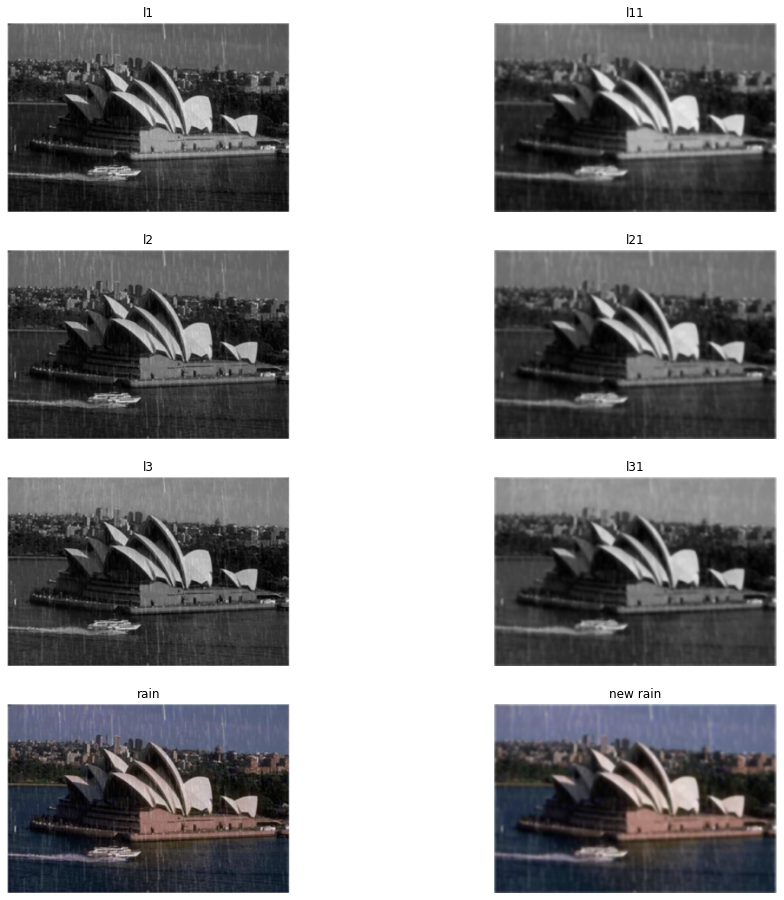

In [124]:
l1,l2,l3=layered_img(rain.img)
l11=bilateral_filtering(l1,5,4,11)
l21=bilateral_filtering(l2,5,4,11)
l31=bilateral_filtering(l3,5,4,11)
l11*= 255.0/l11.max()
l21*= 255.0/l21.max()
l31*= 255.0/l31.max()
img3=delayer_img(l11,l21,l31)
Bilateral=Subplot()
Bilateral.print_img_subplot(4,2,[16,16],8,[l1,l11,l2,l21,l3,l31,rain.img,img3],["l1","l11","l2","l21","l3","l31","rain","new rain"])


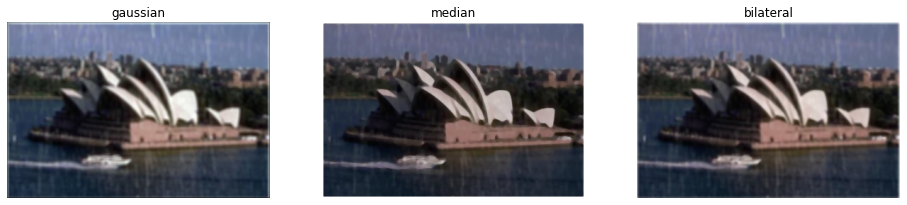

In [125]:
Final=Subplot()
Final.print_img_subplot(1,3,[16,16],3,[img1,img2,img3],["gaussian","median","bilateral"])

## Result : Gaussian Filter <  Median Filter < Bilateral Filter
### + Gaussian Filter : more blured image
### + less blured image than gaussian but somewhat similar to bilater filter but less rain in bilateral filter

# Question 5

In [126]:
girl=Image()
girl.read_local_img("../images/trian.png")
girlp=Subplot()

In [127]:
def bi3(img,k,s1,s2):
    l1,l2,l3=layered_img(img)
    l11=bilateral_filtering(l1,k,s1,s2)
    l21=bilateral_filtering(l2,k,s1,s2)
    l31=bilateral_filtering(l3,k,s1,s2)
    l11*= 255.0/l11.max()
    l21*= 255.0/l21.max()
    l31*= 255.0/l31.max()
    img3=delayer_img(l11,l21,l31)
    return img3

In [128]:
def adv(img,k,f):
    arr=np.zeros((img.shape[0],img.shape[1])).astype(np.uint8)
    brr=gaussian_filter(img,k,f)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if(brr[i][j]<k*k*img[i][j]):
                arr[i][j]=255
    return arr

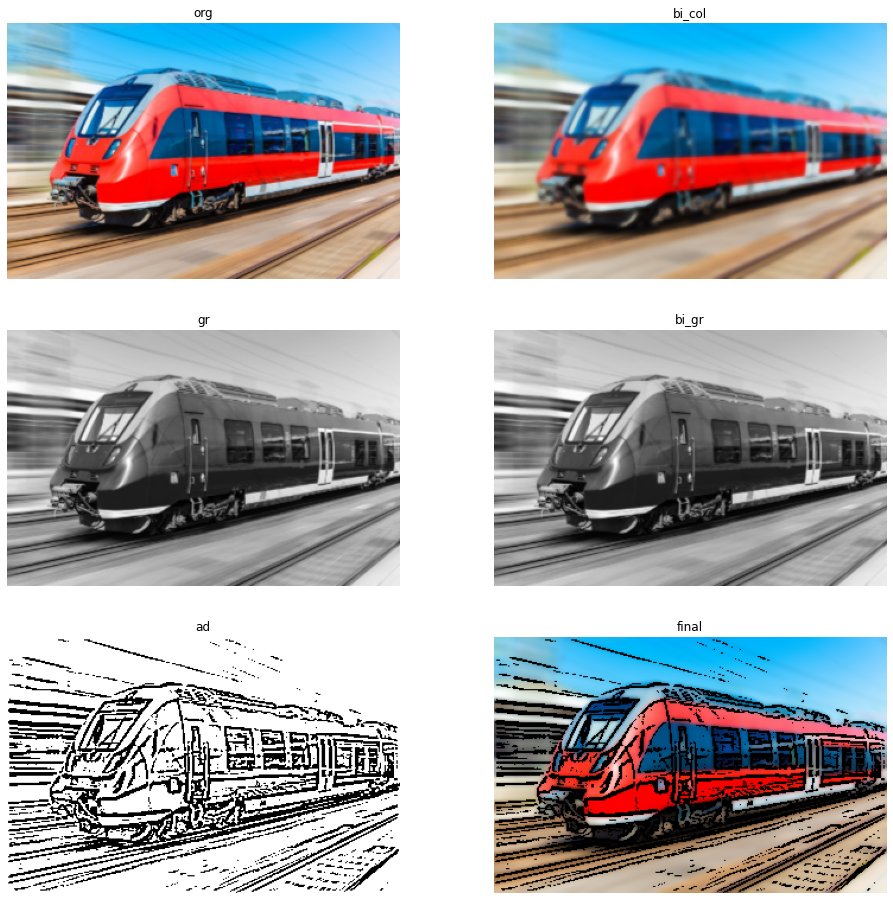

In [129]:
girl_gr=cv2.cvtColor(girl.img,cv2.COLOR_BGR2GRAY)
girl_bi_col=bi3(girl.img,5,10,10)
girl_bi_gr=bilateral_filter(girl_gr,5,1,1)
# girl_ad = cv2.adaptiveThreshold(girl_bi_gr, 255, cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,3,3)
girl_ad=adv(girl_bi_gr,5,15)
final = np.bitwise_and(girl_bi_col,delayer_img(girl_ad,girl_ad,girl_ad))
girlp.print_img_subplot(3,2,[16,16],6,[girl.img,girl_bi_col,girl_gr,girl_bi_gr,girl_ad,final],["org","bi_col","gr","bi_gr","ad","final"])


In [130]:
girl=Image()
girl.read_local_img("../images/captured_img1.jpg")
girlp=Subplot()

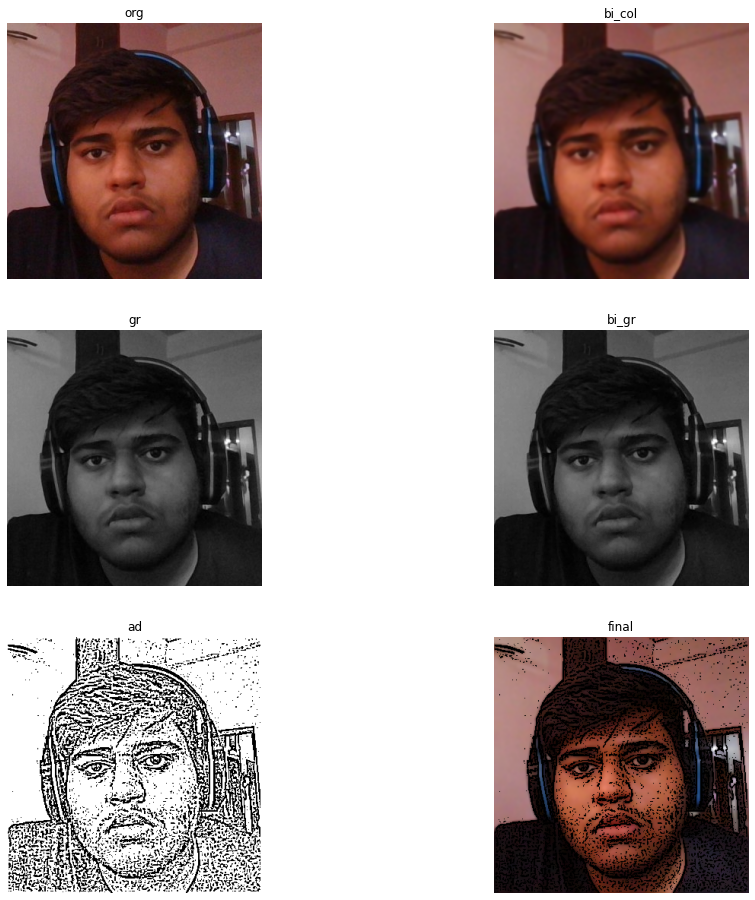

In [131]:
girl_gr=cv2.cvtColor(girl.img,cv2.COLOR_BGR2GRAY)
girl_bi_col=bi3(girl.img,5,10,10)
girl_bi_gr=bilateral_filter(girl_gr,5,1,1)
# girl_ad = cv2.adaptiveThreshold(girl_bi_gr, 255, cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,3,3)
girl_ad=adv(girl_bi_gr,5,15)
final = np.bitwise_and(girl_bi_col,delayer_img(girl_ad,girl_ad,girl_ad))
girlp.print_img_subplot(3,2,[16,16],6,[girl.img,girl_bi_col,girl_gr,girl_bi_gr,girl_ad,final],["org","bi_col","gr","bi_gr","ad","final"])


# Question 6

In [132]:
orion = Image()
orion.read_local_img("../images/orion.jpg")
orion.img=cv2.cvtColor(orion.img,cv2.COLOR_BGR2GRAY)


## part 1

In [133]:
def unsharp(img,k,fs):
    img_copy=np.zeros(img.shape).astype(np.uint8)
    for i in range(0,img.shape[0]):
        for j in range(0,img.shape[1]):
            img_copy[i][j]=img[i][j]
    fil=np.zeros((fs,fs))
    fil.fill(-1)
    fil[fs//2][fs//2]=fs*fs-1
    fil=fil.astype(np.int8)
    blr_img=magic(fil,img_copy)
    arr = (k+1)*img + k*blr_img
    return arr

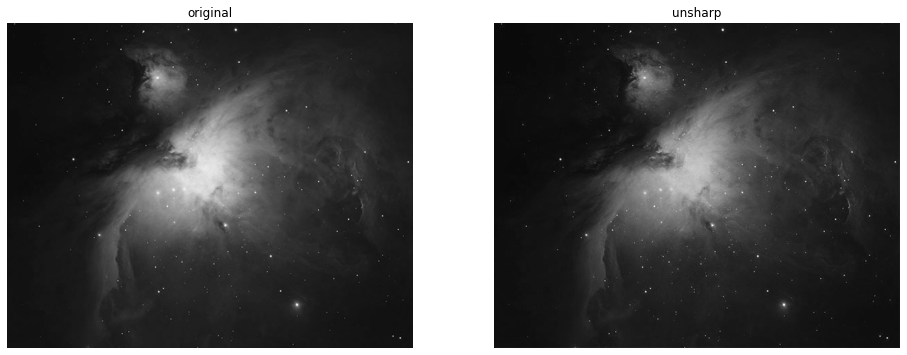

In [134]:
fil=[[-1,-1,-1],[-1,8,-1],[-1,-1,-1]]
img=unsharp(orion.img,0.2,3)
orio= Subplot()
orio.print_img_subplot(1,2,[16,16],2,[orion.img,img],["original","unsharp"])

## part 2

In [135]:
def high_boost(img,wt,k,fs):
    fil=np.zeros((fs,fs))
    fil.fill(-1)
    fil[fs//2][fs//2]=fs*fs*wt-1
    fil=fil.astype(np.int8)
    return unsharp(img,k,fs)

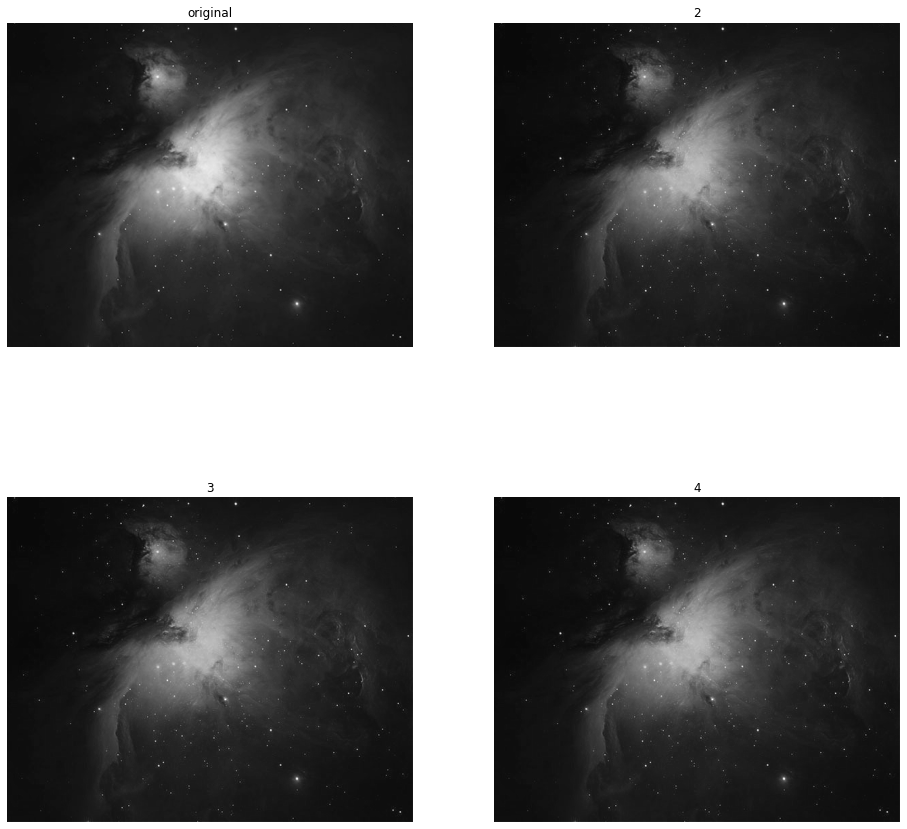

In [136]:
orio= Subplot()
orio.print_img_subplot(2,2,[16,16],4,[orion.img,high_boost(orion.img,2,0.3,3),high_boost(orion.img,3,0.3,3),high_boost(orion.img,4,0.3,3)],["original","2","3","4"])

### central pixel contributes more in the output image as weight increases results in more sharpnhing image

## part 3

In [137]:
aa=[]
bb=[]
cc=[]
aa.append(orion.img)
bb.append(orion.img)
cc.append('Original Image')
for i in range(0,3):
    aa.append(unsharp(orion.img,0.2,i+i+3))
    bb.append(high_boost(orion.img,2,0.2,i+i+3))
    cc.append(str("Kernel Size "+str(i+i+3)+"x"+str(i+i+3)))

Unsharp


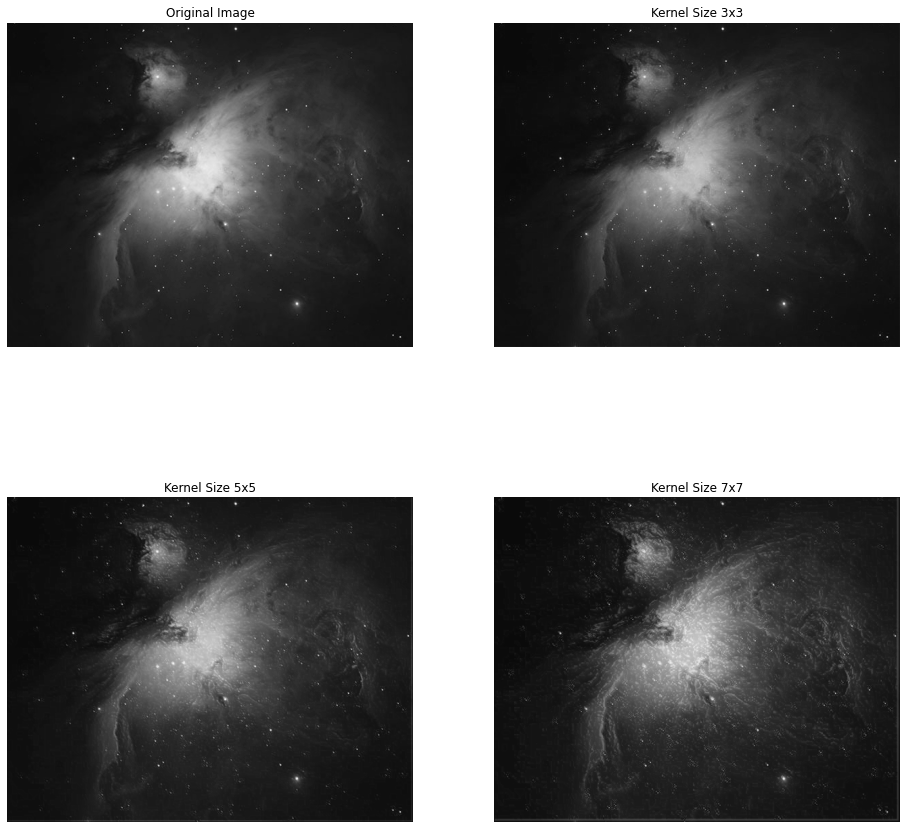

In [138]:
print("Unsharp")
orio.print_img_subplot(2,2,[16,16],4,aa,cc)


High Boost with k=0.2 and differnet kernel sizes


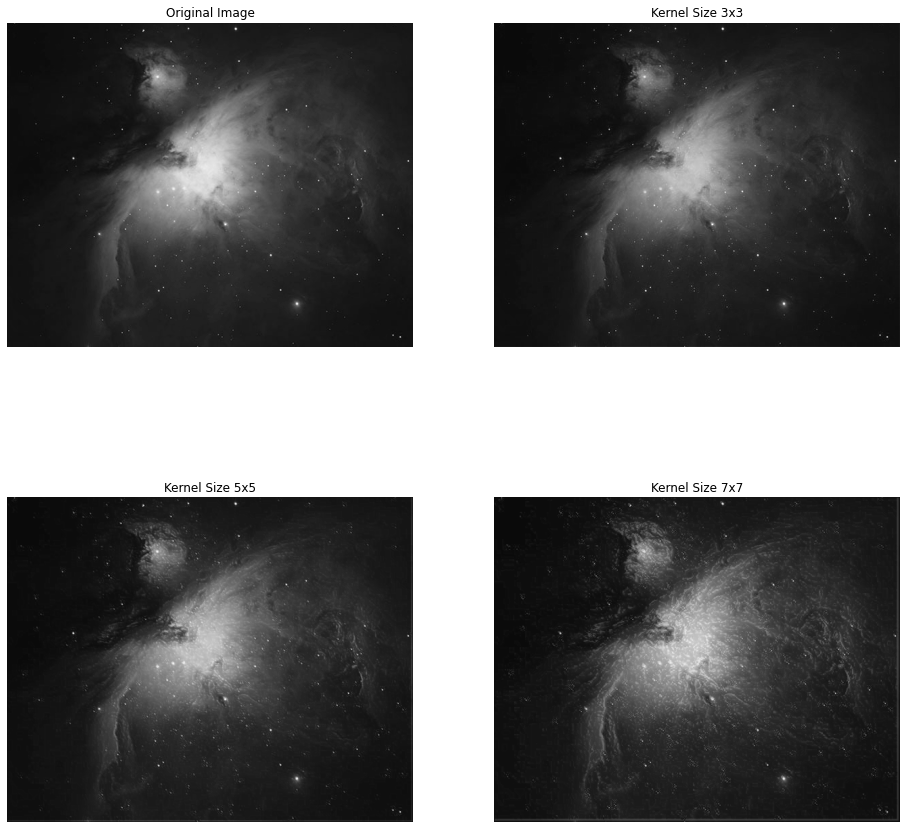

In [139]:
print("High Boost with k=0.2 and differnet kernel sizes")
orio.print_img_subplot(2,2,[16,16],4,bb,cc)

### as kernal size increses the edges in the image become for visible which eventually decreases the quality of image

High Boost with kernel size=3 and differnet k values


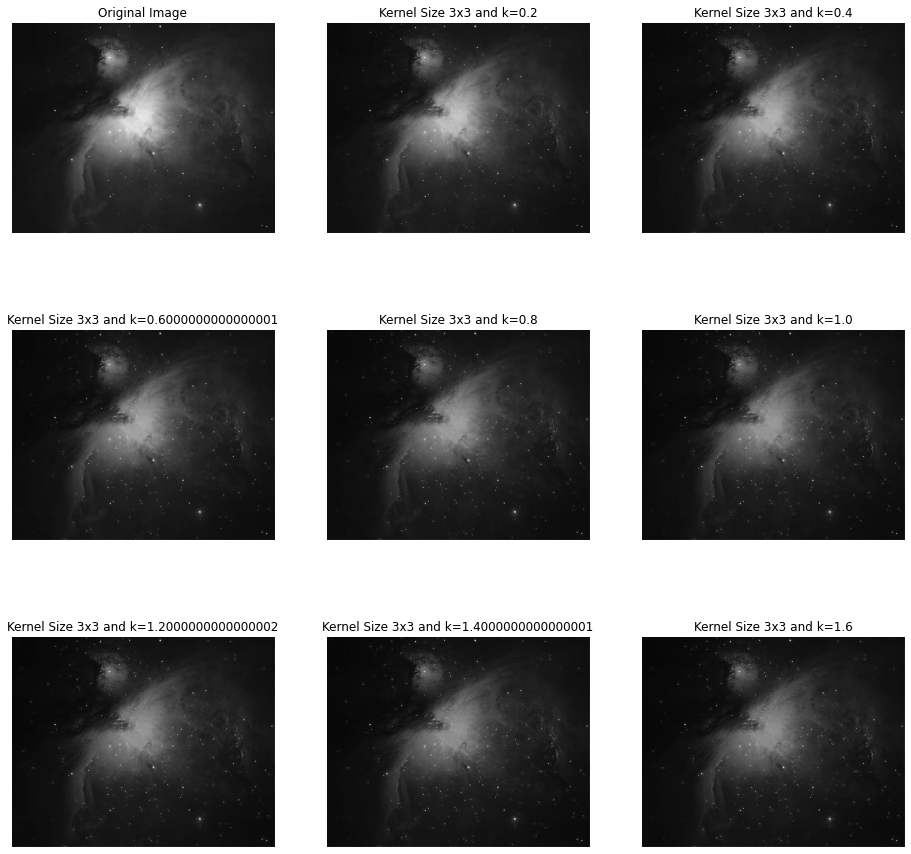

In [140]:
bb=[]
cc=[]
bb.append(orion.img)
cc.append('Original Image')
for i in range(1,10):
    bb.append(high_boost(orion.img,2,0.2*i,3))
    cc.append(str("Kernel Size 3x3 and k=" +str(i*0.2)))
sun=Subplot()
print("High Boost with kernel size=3 and differnet k values")
sun.print_img_subplot(3,3,[16,16],9,bb,cc)

### as k value increases image get sharper and sharper since we are adding k time diff of orignal image and unsharp image but very less differnece visible by eye